In [ ]:
import torch
torch.cuda.empty_cache()

In [ ]:
import os

DATA_DIR = './train'
print(os.listdir(DATA_DIR))

['female']


In [ ]:
print(os.listdir(DATA_DIR+'/female')[:10])

['000004.jpg', '000009.jpg', '000014.jpg', '000044.jpg', '000074.jpg', '000085.jpg', '000096.jpg', '000110.jpg', '000111.jpg', '000121.jpg']


In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 128
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

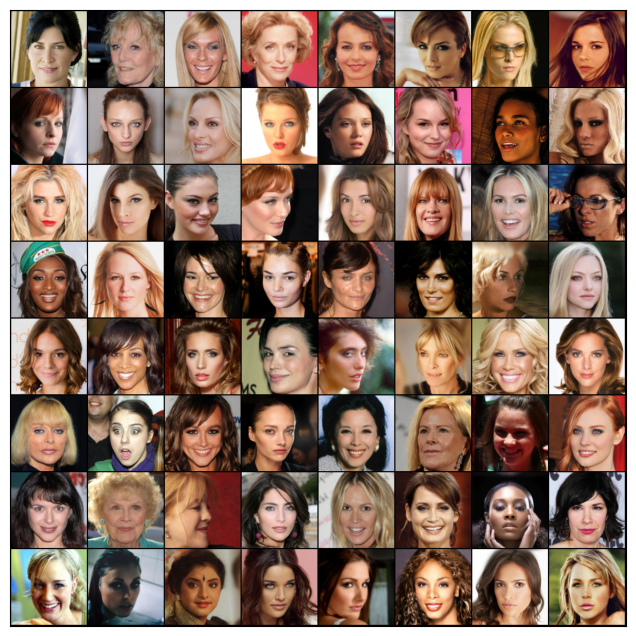

In [ ]:
show_batch(train_dl)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 128 x 128
    # Layer 1: downsample to 64 x 64
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 64 x 64
    # Layer 2: downsample to 32 x 32
    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 32 x 32
    # Layer 3: downsample to 16 x 16
    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 16 x 16
    # Layer 4: downsample to 8 x 8
    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 8 x 8
    # Layer 5: downsample to 4 x 4
    nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(1024),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 1024 x 4 x 4
    # Layer 6: downsample to 1 x 1
    nn.Conv2d(1024, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)


In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 256

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 1024, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(1024),
    nn.ReLU(True),
    # out: 1024 x 4 x 4

    nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 8 x 8

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 16 x 16

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 32 x 32

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 64 x 64

    # New layer: upsample to 128 x 128
    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 128 x 128
)


torch.Size([128, 3, 128, 128])


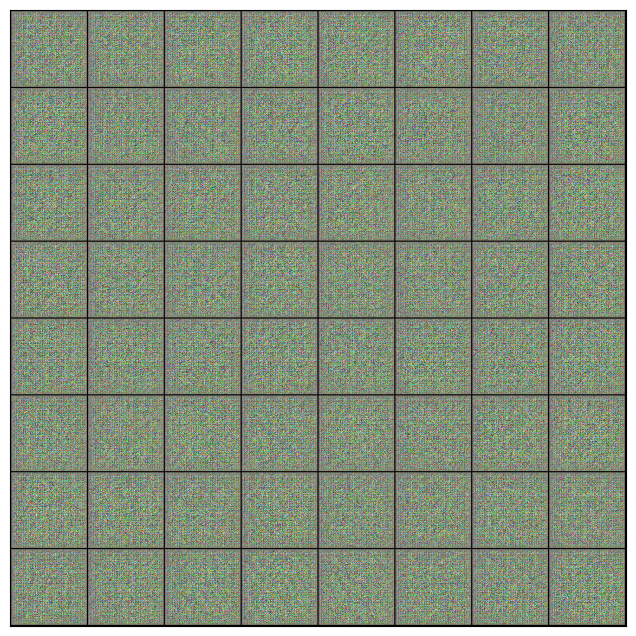

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated-2'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-2-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99996..0.9998127].


Saving generated-2-images-0000.png


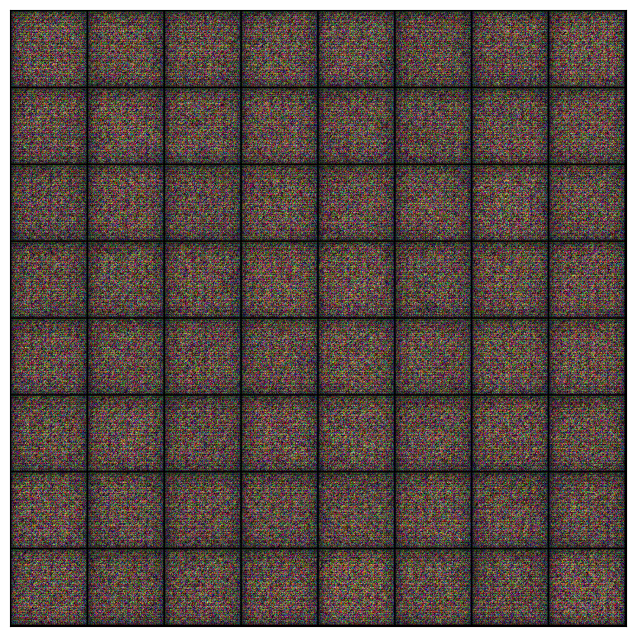

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 100

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 9.1280, loss_d: 0.0091, real_score: 0.9940, fake_score: 0.0031
Saving generated-2-images-0001.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 2.2570, loss_d: 1.7814, real_score: 0.2063, fake_score: 0.0214


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 1.6342, loss_d: 0.8262, real_score: 0.6392, fake_score: 0.2488


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 3.3917, loss_d: 0.4934, real_score: 0.7512, fake_score: 0.1554


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 2.7870, loss_d: 0.9134, real_score: 0.4952, fake_score: 0.0710


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 5.4949, loss_d: 1.0298, real_score: 0.7391, fake_score: 0.4551


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 2.6140, loss_d: 0.5639, real_score: 0.6579, fake_score: 0.0790


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 1.6238, loss_d: 1.2684, real_score: 0.3582, fake_score: 0.0724


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 2.2737, loss_d: 0.6842, real_score: 0.6061, fake_score: 0.0490


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 4.1950, loss_d: 0.9812, real_score: 0.4808, fake_score: 0.0118


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 2.5517, loss_d: 0.6954, real_score: 0.6581, fake_score: 0.1303
Saving generated-2-images-0011.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 2.4021, loss_d: 0.8951, real_score: 0.6137, fake_score: 0.2695


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 3.7041, loss_d: 0.7851, real_score: 0.7644, fake_score: 0.3578


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 1.6486, loss_d: 1.2071, real_score: 0.3703, fake_score: 0.0176


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 2.0236, loss_d: 0.9866, real_score: 0.5236, fake_score: 0.1602


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 0.8091, loss_d: 1.0168, real_score: 0.4976, fake_score: 0.1516


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 0.3873, loss_d: 1.6817, real_score: 0.2864, fake_score: 0.0151


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 6.3525, loss_d: 0.7969, real_score: 0.9385, fake_score: 0.4884


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 2.9333, loss_d: 0.6040, real_score: 0.5831, fake_score: 0.0178


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 3.4265, loss_d: 0.4780, real_score: 0.9747, fake_score: 0.3308


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 3.2966, loss_d: 0.7709, real_score: 0.8368, fake_score: 0.3964
Saving generated-2-images-0021.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 3.6019, loss_d: 0.3668, real_score: 0.8114, fake_score: 0.1289


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 6.3713, loss_d: 1.2027, real_score: 0.9698, fake_score: 0.6469


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 5.9141, loss_d: 1.1630, real_score: 0.9895, fake_score: 0.6338


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 0.8909, loss_d: 0.6512, real_score: 0.6397, fake_score: 0.1084


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 0.2156, loss_d: 1.2985, real_score: 0.3230, fake_score: 0.0352


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 2.1327, loss_d: 0.3488, real_score: 0.9201, fake_score: 0.1979


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 3.4600, loss_d: 0.5187, real_score: 0.9526, fake_score: 0.3335


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 0.6040, loss_d: 0.7238, real_score: 0.5676, fake_score: 0.0810


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 3.1426, loss_d: 0.1648, real_score: 0.9060, fake_score: 0.0584


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 1.4817, loss_d: 0.8395, real_score: 0.5137, fake_score: 0.0209
Saving generated-2-images-0031.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 1.5237, loss_d: 0.5432, real_score: 0.6827, fake_score: 0.0915


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 7.6634, loss_d: 1.9466, real_score: 0.9803, fake_score: 0.7803


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 0.1875, loss_d: 0.8843, real_score: 0.4830, fake_score: 0.0422


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 4.3421, loss_d: 0.3341, real_score: 0.9679, fake_score: 0.2452


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 0.8929, loss_d: 0.5420, real_score: 0.6526, fake_score: 0.0475


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 2.3952, loss_d: 0.4362, real_score: 0.7070, fake_score: 0.0426


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 6.2962, loss_d: 1.3152, real_score: 0.9750, fake_score: 0.6587


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 3.9665, loss_d: 0.4153, real_score: 0.9638, fake_score: 0.2884


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 2.8465, loss_d: 0.6285, real_score: 0.6014, fake_score: 0.0266


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 3.8909, loss_d: 0.1555, real_score: 0.8868, fake_score: 0.0288
Saving generated-2-images-0041.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 2.1967, loss_d: 0.4124, real_score: 0.7501, fake_score: 0.0921


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 0.3098, loss_d: 0.9780, real_score: 0.4481, fake_score: 0.0365


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 1.0968, loss_d: 0.5846, real_score: 0.6253, fake_score: 0.0605


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 3.5362, loss_d: 0.3573, real_score: 0.7844, fake_score: 0.0312


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 1.9070, loss_d: 0.5282, real_score: 0.6455, fake_score: 0.0401


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 5.4209, loss_d: 0.1919, real_score: 0.8554, fake_score: 0.0181


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 1.9743, loss_d: 0.3731, real_score: 0.7430, fake_score: 0.0239


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 2.1027, loss_d: 0.6655, real_score: 0.7525, fake_score: 0.2527


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 6.8937, loss_d: 0.6045, real_score: 0.9822, fake_score: 0.3902


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 2.5474, loss_d: 0.6126, real_score: 0.6019, fake_score: 0.0113
Saving generated-2-images-0051.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 5.0354, loss_d: 0.5681, real_score: 0.9769, fake_score: 0.3691


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 3.5443, loss_d: 0.1825, real_score: 0.9642, fake_score: 0.1199


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 3.6533, loss_d: 0.4893, real_score: 0.6653, fake_score: 0.0032


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 3.4640, loss_d: 0.1759, real_score: 0.9603, fake_score: 0.1155


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 3.1085, loss_d: 0.3105, real_score: 0.8823, fake_score: 0.1474


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 4.1699, loss_d: 0.2011, real_score: 0.8994, fake_score: 0.0639


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 0.0608, loss_d: 1.1016, real_score: 0.4413, fake_score: 0.0454


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 0.7262, loss_d: 0.5595, real_score: 0.6384, fake_score: 0.0092


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 6.1491, loss_d: 0.1867, real_score: 0.9937, fake_score: 0.1537


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 3.7172, loss_d: 0.1964, real_score: 0.9287, fake_score: 0.1054
Saving generated-2-images-0061.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 5.7532, loss_d: 0.2731, real_score: 0.9889, fake_score: 0.2064


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 6.1762, loss_d: 0.7804, real_score: 0.9872, fake_score: 0.4275


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 0.9187, loss_d: 1.4401, real_score: 0.3164, fake_score: 0.0012


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 3.9429, loss_d: 0.1685, real_score: 0.9634, fake_score: 0.1145


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 3.6881, loss_d: 0.1403, real_score: 0.9069, fake_score: 0.0221


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 4.7578, loss_d: 0.1339, real_score: 0.8853, fake_score: 0.0028


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 3.8907, loss_d: 0.0760, real_score: 0.9690, fake_score: 0.0421


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 4.3112, loss_d: 0.1131, real_score: 0.9341, fake_score: 0.0388


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 9.1957, loss_d: 0.9714, real_score: 0.9378, fake_score: 0.5190


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 3.2492, loss_d: 0.3032, real_score: 0.9055, fake_score: 0.1557
Saving generated-2-images-0071.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 3.1425, loss_d: 0.1059, real_score: 0.9229, fake_score: 0.0208


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 5.5843, loss_d: 0.3176, real_score: 0.9582, fake_score: 0.2087


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 3.1888, loss_d: 0.2203, real_score: 0.8755, fake_score: 0.0726


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 5.3965, loss_d: 2.1656, real_score: 0.9361, fake_score: 0.6179


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 3.1007, loss_d: 0.2343, real_score: 0.9487, fake_score: 0.1517


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 6.1884, loss_d: 0.0759, real_score: 0.9541, fake_score: 0.0244


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 0.8540, loss_d: 2.5441, real_score: 0.1739, fake_score: 0.0006


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 0.8991, loss_d: 0.3860, real_score: 0.7236, fake_score: 0.0129


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 2.8794, loss_d: 0.0900, real_score: 0.9402, fake_score: 0.0214


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 3.7947, loss_d: 0.2059, real_score: 0.9175, fake_score: 0.0957
Saving generated-2-images-0081.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 3.5060, loss_d: 0.6013, real_score: 0.6663, fake_score: 0.0058


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [83/100], loss_g: 2.6359, loss_d: 0.3860, real_score: 0.8310, fake_score: 0.1251


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 0.1036, loss_d: 1.1088, real_score: 0.4275, fake_score: 0.0033


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 4.6921, loss_d: 0.1799, real_score: 0.9679, fake_score: 0.1245


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 1.5742, loss_d: 0.2671, real_score: 0.8422, fake_score: 0.0748


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 7.2896, loss_d: 0.0927, real_score: 0.9965, fake_score: 0.0783


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 6.0136, loss_d: 0.3768, real_score: 0.9437, fake_score: 0.2119


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 2.7245, loss_d: 0.1151, real_score: 0.9229, fake_score: 0.0303


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 4.0269, loss_d: 0.1780, real_score: 0.9823, fake_score: 0.1332


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 5.6158, loss_d: 0.0612, real_score: 0.9993, fake_score: 0.0559
Saving generated-2-images-0091.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 8.3434, loss_d: 0.1021, real_score: 0.9172, fake_score: 0.0070


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 1.0192, loss_d: 0.4743, real_score: 0.6801, fake_score: 0.0043


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 0.3468, loss_d: 1.6578, real_score: 0.2938, fake_score: 0.0002


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 4.3653, loss_d: 0.4301, real_score: 0.9494, fake_score: 0.2250


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 5.7851, loss_d: 0.1230, real_score: 0.9482, fake_score: 0.0580


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 6.6143, loss_d: 0.1292, real_score: 0.9839, fake_score: 0.0998


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 0.3155, loss_d: 2.2558, real_score: 0.1841, fake_score: 0.0002


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 0.3329, loss_d: 0.7754, real_score: 0.5341, fake_score: 0.0228


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 3.2578, loss_d: 0.3404, real_score: 0.7583, fake_score: 0.0053


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

NameError: name 'history' is not defined

In [ ]:
torch.save(generator.state_dict(), 'G2.pth')
torch.save(discriminator.state_dict(), 'D2.pth')

In [ ]:
from IPython.display import Image

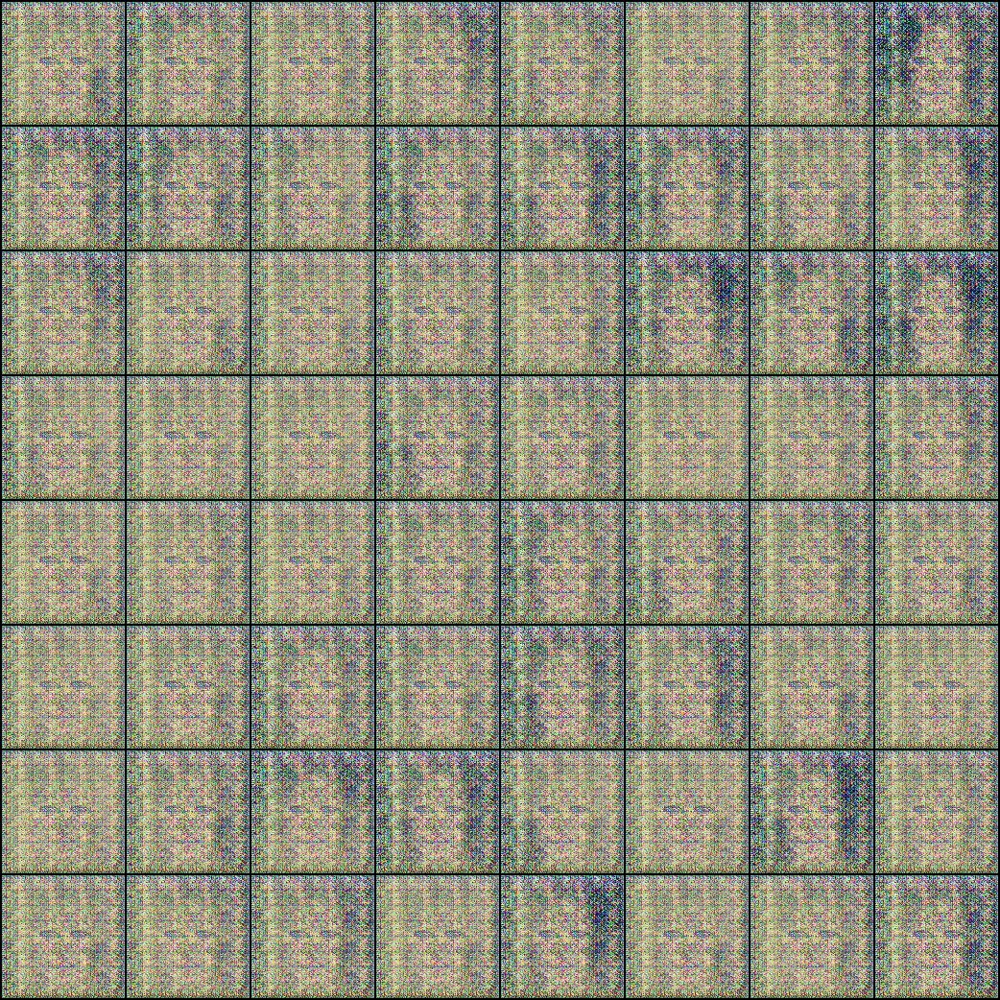

In [ ]:
Image('./generated-2/generated-2-images-0001.png')

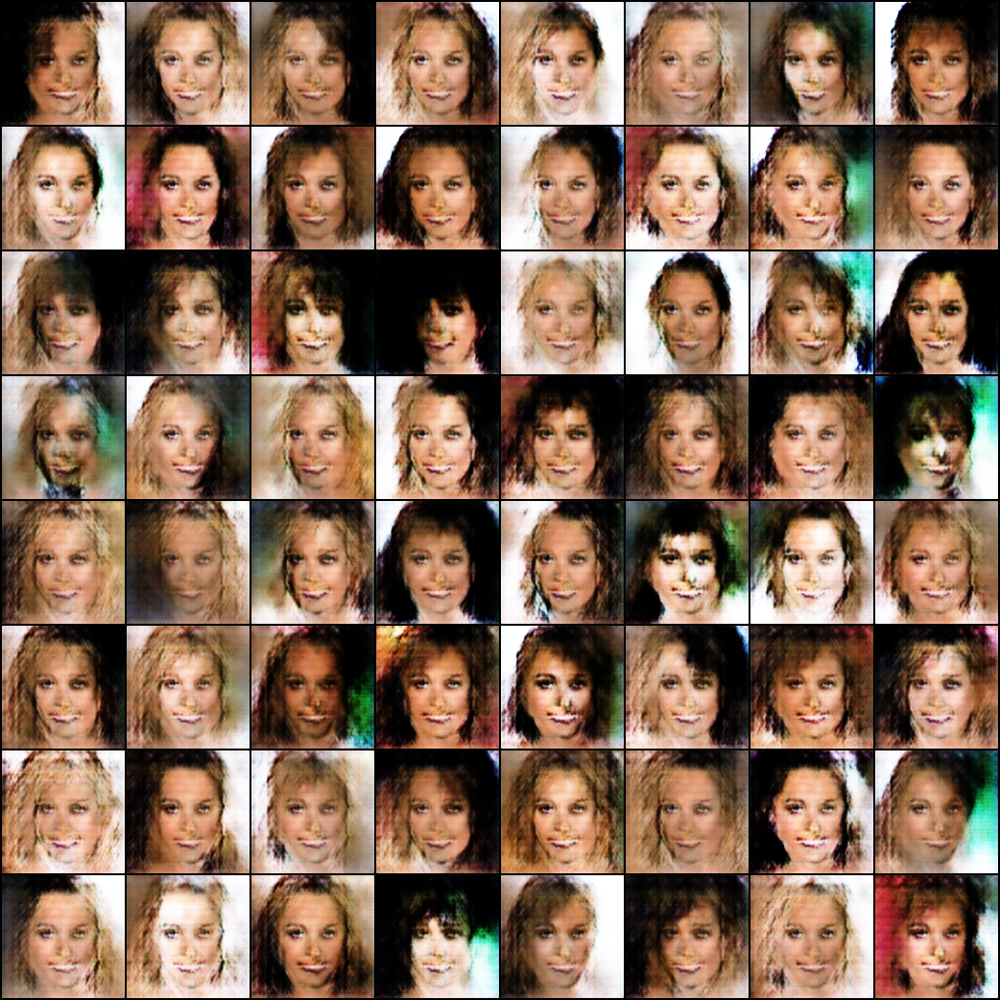

In [ ]:
Image('./generated-2/generated-2-images-0011.png')

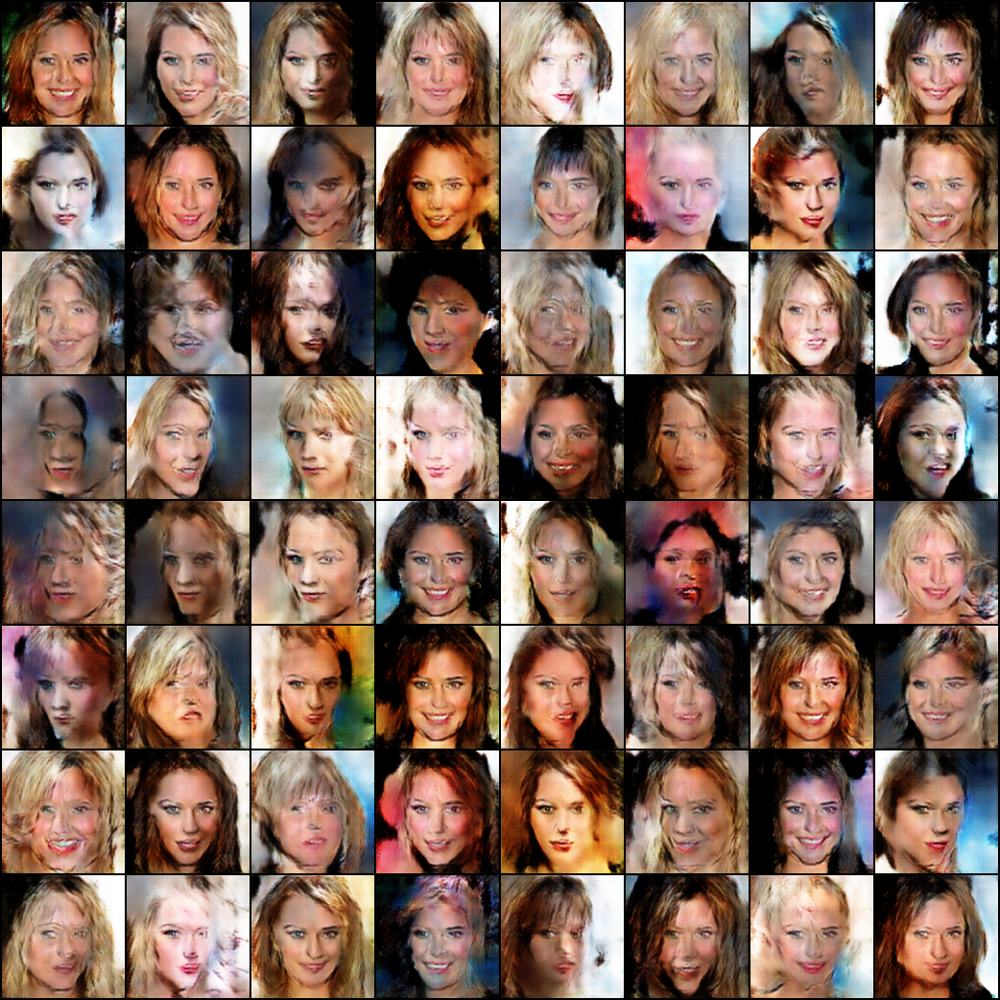

In [ ]:
Image('./generated-2/generated-2-images-0021.png')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9999954..1.0].


Saving generated-2-images-0050.png


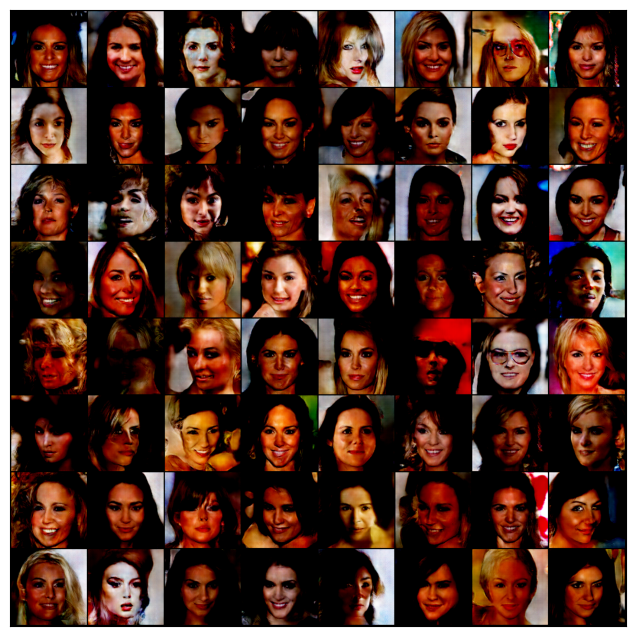

In [ ]:
fake_images = generator(fixed_latent)
fake_fname = 'generated-2-images-0050.png'
save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
print('Saving', fake_fname)
if True:
        fig, ax = plt.subplots(figsize=(8, 8))s
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
import cv2
import os

vid_fname = 'gans_training-2.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated-2' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

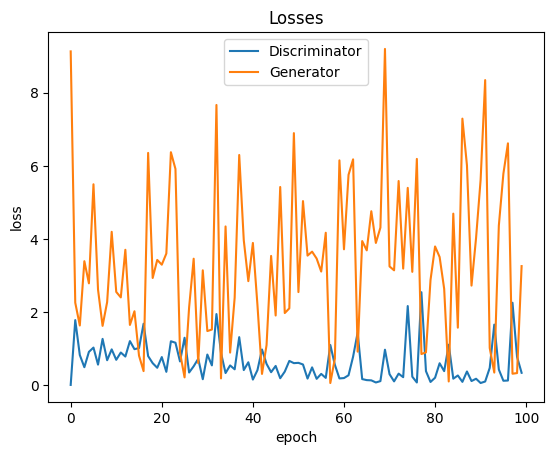

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

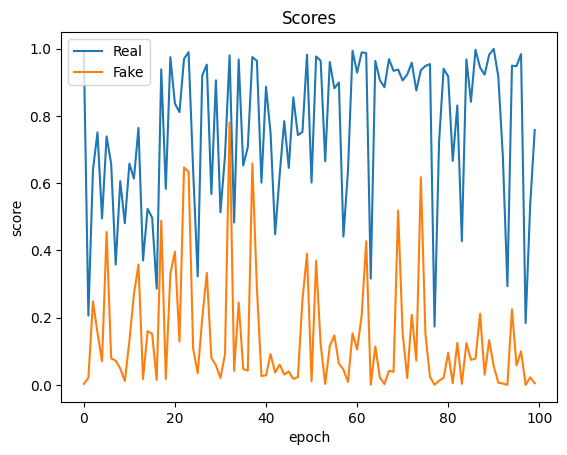

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

In [ ]:
#2

In [ ]:
# Load the saved models
generator.load_state_dict(torch.load('G2.pth'))
discriminator.load_state_dict(torch.load('D2.pth'))


C:\Users\yuvas\AppData\Local\Temp\ipykernel_15976\2008634439.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load('G2.pth'))
C:\Users\yuv

<All keys matched successfully>

In [ ]:

# Move the models to the device (GPU/CPU)
generator = to_device(generator, device)
discriminator = to_device(discriminator, device)

In [ ]:
lr = 0.0002
opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

In [ ]:
epochs = 100
history = fit(epochs, lr, start_idx=101)
losses_g, losses_d, real_scores, fake_scores = history

  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 5.8119, loss_d: 0.0685, real_score: 0.9442, fake_score: 0.0086
Saving generated-2-images-0101.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 3.5400, loss_d: 0.1456, real_score: 0.9291, fake_score: 0.0631


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 3.4918, loss_d: 0.0957, real_score: 0.9396, fake_score: 0.0285


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 1.6168, loss_d: 1.2019, real_score: 0.5638, fake_score: 0.1413


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 2.9948, loss_d: 0.1237, real_score: 0.9233, fake_score: 0.0332


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 5.4414, loss_d: 0.0434, real_score: 0.9777, fake_score: 0.0196


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 4.6310, loss_d: 0.0581, real_score: 0.9600, fake_score: 0.0159


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 4.7362, loss_d: 0.1748, real_score: 0.9275, fake_score: 0.0776


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 5.0922, loss_d: 0.1608, real_score: 0.9504, fake_score: 0.0823


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 1.5770, loss_d: 0.1366, real_score: 0.9229, fake_score: 0.0403


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 13.5150, loss_d: 2.0695, real_score: 0.9993, fake_score: 0.7615
Saving generated-2-images-0111.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 4.9916, loss_d: 0.0220, real_score: 0.9986, fake_score: 0.0197


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 6.0705, loss_d: 0.0104, real_score: 0.9986, fake_score: 0.0088


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 3.0313, loss_d: 0.5170, real_score: 0.7315, fake_score: 0.0009


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 6.7007, loss_d: 0.2056, real_score: 0.9262, fake_score: 0.0935


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 0.0087, loss_d: 1.3313, real_score: 0.3683, fake_score: 0.0014


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 0.2652, loss_d: 1.5920, real_score: 0.3481, fake_score: 0.0066


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 5.8504, loss_d: 0.0195, real_score: 0.9979, fake_score: 0.0168


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 4.5162, loss_d: 0.0849, real_score: 0.9520, fake_score: 0.0329


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 2.1045, loss_d: 0.2292, real_score: 0.8232, fake_score: 0.0138


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 3.7335, loss_d: 0.1149, real_score: 0.9243, fake_score: 0.0248
Saving generated-2-images-0121.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 5.3444, loss_d: 0.1408, real_score: 0.8865, fake_score: 0.0036


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 5.7450, loss_d: 0.0710, real_score: 0.9639, fake_score: 0.0297


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 1.3658, loss_d: 6.7388, real_score: 0.3132, fake_score: 0.1123


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 8.3947, loss_d: 0.8146, real_score: 0.9928, fake_score: 0.4457


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 3.8454, loss_d: 0.2520, real_score: 0.8368, fake_score: 0.0232


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 6.1427, loss_d: 0.0339, real_score: 0.9794, fake_score: 0.0121


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 3.5315, loss_d: 0.1620, real_score: 0.8727, fake_score: 0.0043


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 6.0597, loss_d: 0.0652, real_score: 0.9563, fake_score: 0.0175


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 5.8482, loss_d: 0.3272, real_score: 0.9972, fake_score: 0.1759


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 4.6505, loss_d: 0.0887, real_score: 0.9485, fake_score: 0.0272
Saving generated-2-images-0131.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 3.8401, loss_d: 0.2766, real_score: 0.7818, fake_score: 0.0022


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 5.8192, loss_d: 0.0443, real_score: 0.9968, fake_score: 0.0380


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 3.7731, loss_d: 0.0866, real_score: 0.9311, fake_score: 0.0075


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 0.2248, loss_d: 3.5190, real_score: 0.0564, fake_score: 0.0001


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 6.1303, loss_d: 0.0072, real_score: 0.9988, fake_score: 0.0060


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 6.2782, loss_d: 0.0714, real_score: 0.9465, fake_score: 0.0077


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 5.7799, loss_d: 0.0510, real_score: 0.9626, fake_score: 0.0105


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 5.5523, loss_d: 0.0630, real_score: 0.9906, fake_score: 0.0479


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 5.7881, loss_d: 0.0473, real_score: 0.9632, fake_score: 0.0080


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 4.8467, loss_d: 0.1069, real_score: 0.9516, fake_score: 0.0463
Saving generated-2-images-0141.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 1.3874, loss_d: 0.2731, real_score: 0.8033, fake_score: 0.0226


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 3.8621, loss_d: 0.0869, real_score: 0.9464, fake_score: 0.0230


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 4.8344, loss_d: 0.1118, real_score: 0.9336, fake_score: 0.0343


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 12.2413, loss_d: 0.9169, real_score: 0.9892, fake_score: 0.4433


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 5.6070, loss_d: 0.0825, real_score: 0.9842, fake_score: 0.0589


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 8.3546, loss_d: 0.1567, real_score: 0.8942, fake_score: 0.0082


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 3.3247, loss_d: 0.1238, real_score: 0.9026, fake_score: 0.0070


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 11.6913, loss_d: 0.9823, real_score: 0.9963, fake_score: 0.4820


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 6.6608, loss_d: 0.1041, real_score: 0.9967, fake_score: 0.0852


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 2.6388, loss_d: 0.2764, real_score: 0.8361, fake_score: 0.0483
Saving generated-2-images-0151.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 2.6055, loss_d: 0.4042, real_score: 0.8107, fake_score: 0.0597


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 2.9546, loss_d: 0.1146, real_score: 0.9356, fake_score: 0.0417


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 13.5376, loss_d: 0.4196, real_score: 0.7031, fake_score: 0.0000


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 6.6363, loss_d: 0.1640, real_score: 0.9767, fake_score: 0.1192


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 1.3920, loss_d: 0.1944, real_score: 0.8440, fake_score: 0.0105


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 5.4908, loss_d: 0.0291, real_score: 0.9810, fake_score: 0.0092


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 8.6523, loss_d: 0.2949, real_score: 0.9995, fake_score: 0.1698


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 3.9106, loss_d: 0.1431, real_score: 0.8758, fake_score: 0.0013


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 4.3917, loss_d: 0.1086, real_score: 0.9216, fake_score: 0.0137


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 3.5825, loss_d: 0.1611, real_score: 0.8936, fake_score: 0.0360
Saving generated-2-images-0161.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 6.7252, loss_d: 0.1431, real_score: 0.9465, fake_score: 0.0571


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 6.1371, loss_d: 0.0280, real_score: 0.9959, fake_score: 0.0226


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 7.8350, loss_d: 0.1220, real_score: 0.9926, fake_score: 0.0812


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 7.3765, loss_d: 0.0593, real_score: 0.9999, fake_score: 0.0537


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 0.2858, loss_d: 0.6806, real_score: 0.6519, fake_score: 0.0054


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 5.5718, loss_d: 0.1113, real_score: 0.9373, fake_score: 0.0226


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 5.4662, loss_d: 0.0629, real_score: 0.9451, fake_score: 0.0031


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 18.2066, loss_d: 0.6988, real_score: 0.9912, fake_score: 0.4130


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 1.9587, loss_d: 0.3868, real_score: 0.7435, fake_score: 0.0210


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 0.7327, loss_d: 0.4720, real_score: 0.6813, fake_score: 0.0029
Saving generated-2-images-0171.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 0.1912, loss_d: 0.5765, real_score: 0.6611, fake_score: 0.0116


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 7.7436, loss_d: 0.0410, real_score: 0.9710, fake_score: 0.0045


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 6.8552, loss_d: 0.0315, real_score: 0.9909, fake_score: 0.0214


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 9.1693, loss_d: 0.0037, real_score: 0.9982, fake_score: 0.0019


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 14.8611, loss_d: 2.5659, real_score: 1.0000, fake_score: 0.7755


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 6.1808, loss_d: 0.0085, real_score: 0.9994, fake_score: 0.0078


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 5.4798, loss_d: 0.0763, real_score: 0.9729, fake_score: 0.0431


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 5.1829, loss_d: 0.0471, real_score: 0.9915, fake_score: 0.0366


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 6.0692, loss_d: 0.1739, real_score: 0.9974, fake_score: 0.1269


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 6.9551, loss_d: 0.0528, real_score: 0.9985, fake_score: 0.0454
Saving generated-2-images-0181.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 6.9099, loss_d: 0.0169, real_score: 0.9992, fake_score: 0.0156


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [83/100], loss_g: 6.3551, loss_d: 0.0431, real_score: 0.9999, fake_score: 0.0318


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 3.4043, loss_d: 0.1476, real_score: 0.8978, fake_score: 0.0024


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 0.0015, loss_d: 1.3923, real_score: 0.4571, fake_score: 0.0098


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 4.4085, loss_d: 0.0551, real_score: 0.9549, fake_score: 0.0062


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 0.3978, loss_d: 0.5264, real_score: 0.6744, fake_score: 0.0129


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 1.6217, loss_d: 0.5001, real_score: 0.6730, fake_score: 0.0289


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 2.2054, loss_d: 0.1189, real_score: 0.9301, fake_score: 0.0347


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 1.0283, loss_d: 0.2704, real_score: 0.8096, fake_score: 0.0306


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 5.9644, loss_d: 0.0209, real_score: 0.9928, fake_score: 0.0132
Saving generated-2-images-0191.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 5.8114, loss_d: 0.0364, real_score: 0.9977, fake_score: 0.0320


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 6.9832, loss_d: 0.0932, real_score: 0.9997, fake_score: 0.0752


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 5.3457, loss_d: 0.3200, real_score: 0.7939, fake_score: 0.0035


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 0.0519, loss_d: 1.4367, real_score: 0.3585, fake_score: 0.0032


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 5.5205, loss_d: 0.1559, real_score: 0.9933, fake_score: 0.1165


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 2.6079, loss_d: 0.3202, real_score: 0.7663, fake_score: 0.0040


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 6.2437, loss_d: 0.0983, real_score: 0.9411, fake_score: 0.0266


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 5.1615, loss_d: 0.1105, real_score: 0.9480, fake_score: 0.0441


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 5.4489, loss_d: 0.0105, real_score: 0.9965, fake_score: 0.0069


In [ ]:
torch.save(generator.state_dict(), 'G2_updated.pth')
torch.save(discriminator.state_dict(), 'D2_updated.pth')

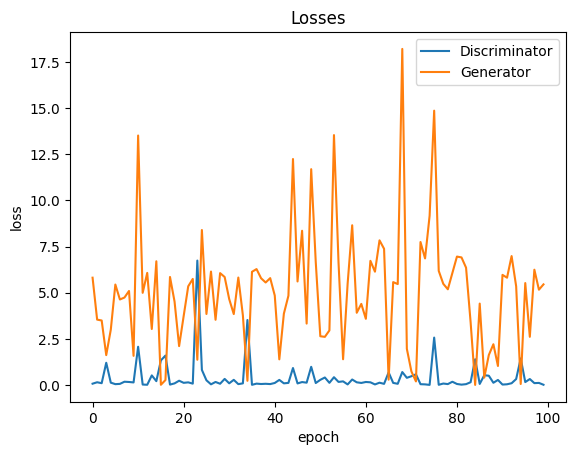

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');


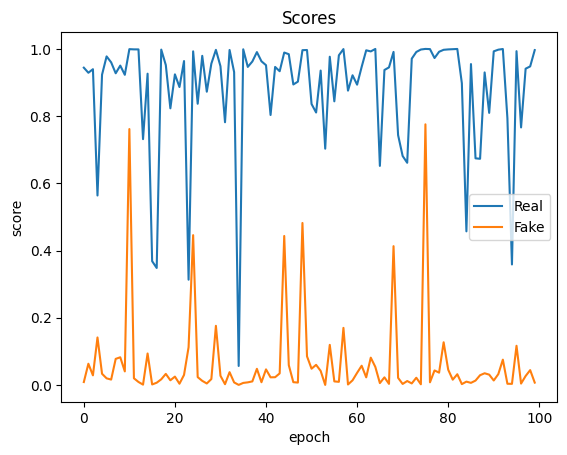

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

In [ ]:
#3

In [ ]:
generator.load_state_dict(torch.load('G2_updated.pth'))
discriminator.load_state_dict(torch.load('D2_updated.pth'))

C:\Users\yuvas\AppData\Local\Temp\ipykernel_9392\2859028943.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load('G2_updated.pth'))
C:\Us

<All keys matched successfully>

In [ ]:
generator = to_device(generator, device)
discriminator = to_device(discriminator, device)

In [ ]:
lr = 0.0002
opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

In [ ]:
epochs = 100
history = fit(epochs, lr, start_idx=201)
losses_g, losses_d, real_scores, fake_scores = history

  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 5.9509, loss_d: 0.0662, real_score: 0.9932, fake_score: 0.0429
Saving generated-2-images-0201.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 7.4158, loss_d: 0.0139, real_score: 0.9993, fake_score: 0.0129


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 0.0318, loss_d: 1.0004, real_score: 0.5160, fake_score: 0.0020


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 5.7140, loss_d: 0.0292, real_score: 0.9951, fake_score: 0.0231


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 5.4296, loss_d: 0.0312, real_score: 0.9880, fake_score: 0.0178


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 1.3152, loss_d: 0.6045, real_score: 0.6887, fake_score: 0.0228


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 8.6749, loss_d: 1.2651, real_score: 0.4125, fake_score: 0.0000


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 6.5414, loss_d: 0.0639, real_score: 0.9551, fake_score: 0.0136


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 5.8226, loss_d: 0.0123, real_score: 0.9968, fake_score: 0.0089


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 4.2196, loss_d: 0.1858, real_score: 0.8796, fake_score: 0.0332


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 5.3632, loss_d: 0.0437, real_score: 0.9996, fake_score: 0.0396
Saving generated-2-images-0211.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 6.7188, loss_d: 0.0298, real_score: 0.9773, fake_score: 0.0048


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 7.0360, loss_d: 0.0237, real_score: 0.9984, fake_score: 0.0193


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 9.7454, loss_d: 0.0368, real_score: 0.9992, fake_score: 0.0166


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 0.4293, loss_d: 0.6959, real_score: 0.6726, fake_score: 0.0021


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 8.1922, loss_d: 0.1154, real_score: 0.9993, fake_score: 0.0944


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 6.1850, loss_d: 0.0357, real_score: 0.9704, fake_score: 0.0051


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 6.9859, loss_d: 0.0149, real_score: 0.9907, fake_score: 0.0054


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 0.9729, loss_d: 0.3185, real_score: 0.8212, fake_score: 0.0202


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 7.5546, loss_d: 0.3244, real_score: 0.9682, fake_score: 0.1928


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 7.3922, loss_d: 0.0204, real_score: 0.9984, fake_score: 0.0176
Saving generated-2-images-0221.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 6.9281, loss_d: 0.0288, real_score: 0.9901, fake_score: 0.0172


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 3.0928, loss_d: 0.1724, real_score: 0.9063, fake_score: 0.0166


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 6.6750, loss_d: 0.1438, real_score: 0.8831, fake_score: 0.0005


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 7.9130, loss_d: 0.1144, real_score: 1.0000, fake_score: 0.0828


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 0.1264, loss_d: 1.1141, real_score: 0.4838, fake_score: 0.0018


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 7.3212, loss_d: 0.0142, real_score: 0.9973, fake_score: 0.0110


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 4.7600, loss_d: 0.0176, real_score: 1.0000, fake_score: 0.0167


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 6.8495, loss_d: 0.0128, real_score: 0.9972, fake_score: 0.0098


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 7.2439, loss_d: 0.0274, real_score: 0.9789, fake_score: 0.0048


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 0.0839, loss_d: 0.9704, real_score: 0.5336, fake_score: 0.0065
Saving generated-2-images-0231.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 6.3869, loss_d: 0.0074, real_score: 0.9993, fake_score: 0.0065


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 7.6620, loss_d: 0.0532, real_score: 0.9566, fake_score: 0.0069


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 29.4249, loss_d: 2.9959, real_score: 1.0000, fake_score: 0.8567


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 4.7749, loss_d: 0.1546, real_score: 0.8938, fake_score: 0.0052


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 0.2048, loss_d: 0.9717, real_score: 0.4824, fake_score: 0.0027


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 6.8902, loss_d: 0.0447, real_score: 0.9824, fake_score: 0.0243


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 8.6269, loss_d: 0.0261, real_score: 0.9783, fake_score: 0.0036


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 3.8715, loss_d: 0.1008, real_score: 0.9300, fake_score: 0.0100


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 8.8772, loss_d: 0.0060, real_score: 0.9967, fake_score: 0.0027


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 1.9776, loss_d: 0.3080, real_score: 0.7776, fake_score: 0.0104
Saving generated-2-images-0241.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 4.5084, loss_d: 0.1413, real_score: 0.9073, fake_score: 0.0087


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 6.4947, loss_d: 0.0719, real_score: 0.9994, fake_score: 0.0548


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 5.9868, loss_d: 0.1818, real_score: 0.9497, fake_score: 0.0627


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 4.6854, loss_d: 0.2576, real_score: 0.8713, fake_score: 0.0726


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 7.9844, loss_d: 0.0378, real_score: 0.9886, fake_score: 0.0228


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 1.5231, loss_d: 0.2304, real_score: 0.8294, fake_score: 0.0176


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 5.9284, loss_d: 0.0341, real_score: 0.9822, fake_score: 0.0149


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 3.7439, loss_d: 0.1388, real_score: 0.8955, fake_score: 0.0170


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 0.7109, loss_d: 0.6493, real_score: 0.6237, fake_score: 0.0060


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 7.4325, loss_d: 0.0296, real_score: 0.9858, fake_score: 0.0143
Saving generated-2-images-0251.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 0.4459, loss_d: 0.5939, real_score: 0.6439, fake_score: 0.0100


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 2.6606, loss_d: 0.2830, real_score: 0.8453, fake_score: 0.0127


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 7.0787, loss_d: 0.0182, real_score: 0.9883, fake_score: 0.0061


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 6.5305, loss_d: 0.0116, real_score: 0.9957, fake_score: 0.0071


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 0.6307, loss_d: 0.6052, real_score: 0.6556, fake_score: 0.0082


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 4.0005, loss_d: 0.1848, real_score: 0.8768, fake_score: 0.0187


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 7.4377, loss_d: 0.0278, real_score: 0.9887, fake_score: 0.0154


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 14.6467, loss_d: 0.4605, real_score: 0.9994, fake_score: 0.2531


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 0.0338, loss_d: 0.9615, real_score: 0.4821, fake_score: 0.0134


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 7.8580, loss_d: 0.0119, real_score: 0.9997, fake_score: 0.0110
Saving generated-2-images-0261.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 11.7742, loss_d: 0.7324, real_score: 1.0000, fake_score: 0.2765


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 12.2041, loss_d: 0.1582, real_score: 0.9965, fake_score: 0.1231


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 1.3912, loss_d: 0.6313, real_score: 0.7355, fake_score: 0.0163


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 6.5318, loss_d: 0.0125, real_score: 0.9997, fake_score: 0.0118


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 7.2232, loss_d: 0.0171, real_score: 0.9935, fake_score: 0.0101


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 7.7915, loss_d: 0.0690, real_score: 0.9422, fake_score: 0.0019


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 5.8489, loss_d: 0.1069, real_score: 0.9285, fake_score: 0.0247


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 7.3995, loss_d: 0.0127, real_score: 0.9933, fake_score: 0.0057


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 7.6724, loss_d: 0.0066, real_score: 0.9984, fake_score: 0.0049


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 6.9629, loss_d: 0.0918, real_score: 0.9452, fake_score: 0.0210
Saving generated-2-images-0271.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 0.0023, loss_d: 1.5791, real_score: 0.3538, fake_score: 0.0047


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 3.8850, loss_d: 0.3238, real_score: 0.8196, fake_score: 0.0436


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 8.2519, loss_d: 0.0360, real_score: 0.9970, fake_score: 0.0232


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 0.0708, loss_d: 1.4372, real_score: 0.4076, fake_score: 0.0082


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 5.4894, loss_d: 0.0472, real_score: 0.9686, fake_score: 0.0128


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 7.2161, loss_d: 0.0119, real_score: 0.9999, fake_score: 0.0113


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 5.0972, loss_d: 0.1389, real_score: 0.8898, fake_score: 0.0013


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 5.0796, loss_d: 0.0701, real_score: 0.9499, fake_score: 0.0157


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 8.4232, loss_d: 0.0432, real_score: 0.9669, fake_score: 0.0056


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 16.3202, loss_d: 0.0087, real_score: 1.0000, fake_score: 0.0080
Saving generated-2-images-0281.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 0.0001, loss_d: 1.9748, real_score: 0.2307, fake_score: 0.0133


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [83/100], loss_g: 2.3987, loss_d: 0.3335, real_score: 0.7703, fake_score: 0.0062


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 7.4682, loss_d: 0.0075, real_score: 0.9997, fake_score: 0.0072


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 7.7778, loss_d: 0.0661, real_score: 0.9792, fake_score: 0.0386


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 6.4240, loss_d: 0.0221, real_score: 0.9846, fake_score: 0.0059


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 1.9645, loss_d: 0.4946, real_score: 0.7662, fake_score: 0.0177


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 6.1410, loss_d: 0.0109, real_score: 0.9945, fake_score: 0.0052


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 7.7293, loss_d: 0.0057, real_score: 0.9993, fake_score: 0.0049


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 3.7116, loss_d: 0.3040, real_score: 0.7909, fake_score: 0.0038


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 1.5929, loss_d: 0.3078, real_score: 0.7714, fake_score: 0.0073
Saving generated-2-images-0291.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 5.3615, loss_d: 0.1083, real_score: 0.9247, fake_score: 0.0211


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 5.0113, loss_d: 0.0664, real_score: 0.9551, fake_score: 0.0161


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 3.4735, loss_d: 0.3501, real_score: 0.8344, fake_score: 0.0010


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 8.7484, loss_d: 0.0045, real_score: 0.9976, fake_score: 0.0021


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 8.2922, loss_d: 0.0102, real_score: 0.9999, fake_score: 0.0098


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 7.6470, loss_d: 0.0025, real_score: 0.9986, fake_score: 0.0011


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 7.2632, loss_d: 0.0401, real_score: 0.9991, fake_score: 0.0296


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 2.0205, loss_d: 0.6944, real_score: 0.7249, fake_score: 0.0037


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 4.9115, loss_d: 0.0902, real_score: 0.9284, fake_score: 0.0068


In [ ]:
torch.save(generator.state_dict(), 'G2_updated2.pth')
torch.save(discriminator.state_dict(), 'D2_updated2.pth')

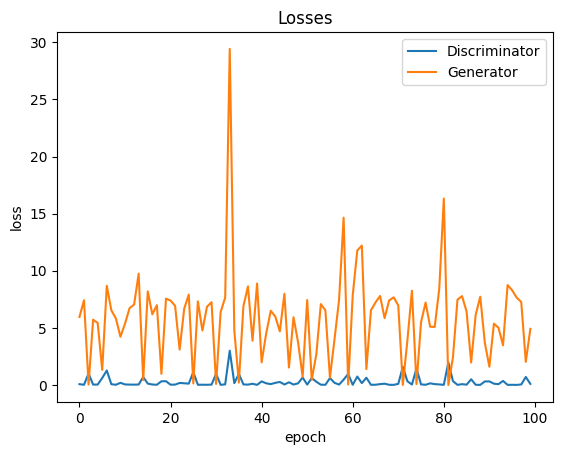

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');


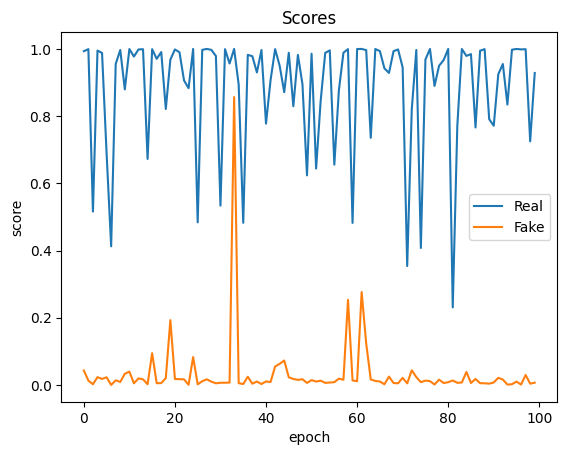

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

In [ ]:
#4

In [ ]:
generator.load_state_dict(torch.load('G2_updated2.pth'))
discriminator.load_state_dict(torch.load('D2_updated2.pth'))

C:\Users\yuvas\AppData\Local\Temp\ipykernel_8372\3670857168.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load('G2_updated2.pth'))
C:\U

<All keys matched successfully>

In [ ]:
generator = to_device(generator, device)
discriminator = to_device(discriminator, device)

In [ ]:
lr = 0.0002
opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

In [ ]:
epochs = 100
history = fit(epochs, lr, start_idx=301)
losses_g, losses_d, real_scores, fake_scores = history







  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 5.6261, loss_d: 0.0695, real_score: 0.9442, fake_score: 0.0077
Saving generated-2-images-0301.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 4.2991, loss_d: 0.5094, real_score: 0.7324, fake_score: 0.0016
Saving generated-2-images-0302.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 8.1404, loss_d: 0.0412, real_score: 0.9824, fake_score: 0.0218
Saving generated-2-images-0303.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 3.2679, loss_d: 0.1847, real_score: 0.8699, fake_score: 0.0141
Saving generated-2-images-0304.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 7.8895, loss_d: 0.0384, real_score: 0.9800, fake_score: 0.0118
Saving generated-2-images-0305.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 4.5276, loss_d: 0.1861, real_score: 0.8597, fake_score: 0.0097
Saving generated-2-images-0306.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 1.7730, loss_d: 0.5885, real_score: 0.7392, fake_score: 0.0087
Saving generated-2-images-0307.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 7.6435, loss_d: 0.0077, real_score: 0.9992, fake_score: 0.0066
Saving generated-2-images-0308.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 8.0013, loss_d: 0.0061, real_score: 0.9970, fake_score: 0.0031
Saving generated-2-images-0309.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 0.3442, loss_d: 0.5099, real_score: 0.7281, fake_score: 0.0082
Saving generated-2-images-0310.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 7.0313, loss_d: 0.0053, real_score: 1.0000, fake_score: 0.0051
Saving generated-2-images-0311.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 6.3574, loss_d: 0.0485, real_score: 0.9854, fake_score: 0.0288
Saving generated-2-images-0312.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 7.1617, loss_d: 0.0603, real_score: 0.9993, fake_score: 0.0541
Saving generated-2-images-0313.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 6.1382, loss_d: 0.1617, real_score: 0.8712, fake_score: 0.0048
Saving generated-2-images-0314.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 7.9197, loss_d: 0.0228, real_score: 0.9804, fake_score: 0.0023
Saving generated-2-images-0315.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 8.2347, loss_d: 0.0322, real_score: 0.9967, fake_score: 0.0269
Saving generated-2-images-0316.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 0.9219, loss_d: 1.5826, real_score: 0.3996, fake_score: 0.0082
Saving generated-2-images-0317.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 0.5970, loss_d: 0.5638, real_score: 0.6519, fake_score: 0.0019
Saving generated-2-images-0318.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 6.7615, loss_d: 0.1946, real_score: 0.9996, fake_score: 0.1260
Saving generated-2-images-0319.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 5.6422, loss_d: 0.0166, real_score: 0.9999, fake_score: 0.0146
Saving generated-2-images-0320.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 9.0814, loss_d: 0.0047, real_score: 0.9992, fake_score: 0.0039
Saving generated-2-images-0321.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 3.1728, loss_d: 0.2387, real_score: 1.0000, fake_score: 0.1228
Saving generated-2-images-0322.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 12.0211, loss_d: 0.0282, real_score: 0.9998, fake_score: 0.0242
Saving generated-2-images-0323.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 3.0083, loss_d: 0.1029, real_score: 0.9248, fake_score: 0.0072
Saving generated-2-images-0324.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 5.1687, loss_d: 0.1718, real_score: 0.8761, fake_score: 0.0026
Saving generated-2-images-0325.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 8.0909, loss_d: 1.1178, real_score: 0.5374, fake_score: 0.0000
Saving generated-2-images-0326.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 0.0970, loss_d: 0.6462, real_score: 0.5892, fake_score: 0.0199
Saving generated-2-images-0327.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 9.1413, loss_d: 0.0065, real_score: 0.9947, fake_score: 0.0011
Saving generated-2-images-0328.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 7.7479, loss_d: 0.0045, real_score: 1.0000, fake_score: 0.0045
Saving generated-2-images-0329.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 7.9893, loss_d: 0.0028, real_score: 0.9982, fake_score: 0.0010
Saving generated-2-images-0330.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 8.1809, loss_d: 0.5810, real_score: 0.9996, fake_score: 0.3110
Saving generated-2-images-0331.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 9.2078, loss_d: 0.0149, real_score: 0.9935, fake_score: 0.0082
Saving generated-2-images-0332.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 0.0346, loss_d: 0.9775, real_score: 0.5334, fake_score: 0.0131
Saving generated-2-images-0333.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 6.4244, loss_d: 0.2196, real_score: 0.8747, fake_score: 0.0131
Saving generated-2-images-0334.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 5.5499, loss_d: 0.0391, real_score: 0.9731, fake_score: 0.0100
Saving generated-2-images-0335.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 6.5135, loss_d: 0.0072, real_score: 0.9999, fake_score: 0.0070
Saving generated-2-images-0336.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 2.5382, loss_d: 0.3298, real_score: 0.7988, fake_score: 0.0116
Saving generated-2-images-0337.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 7.4005, loss_d: 0.0087, real_score: 0.9995, fake_score: 0.0081
Saving generated-2-images-0338.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 2.6702, loss_d: 0.2188, real_score: 0.8185, fake_score: 0.0052
Saving generated-2-images-0339.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 7.4891, loss_d: 0.0213, real_score: 1.0000, fake_score: 0.0161
Saving generated-2-images-0340.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 1.4695, loss_d: 0.2868, real_score: 0.8451, fake_score: 0.0378
Saving generated-2-images-0341.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 0.5118, loss_d: 0.4905, real_score: 0.7005, fake_score: 0.0048
Saving generated-2-images-0342.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 9.0557, loss_d: 0.0059, real_score: 0.9983, fake_score: 0.0041
Saving generated-2-images-0343.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 0.0006, loss_d: 1.6740, real_score: 0.3580, fake_score: 0.0020
Saving generated-2-images-0344.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 3.7518, loss_d: 0.3084, real_score: 0.8156, fake_score: 0.0162
Saving generated-2-images-0345.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 6.6802, loss_d: 0.0396, real_score: 0.9654, fake_score: 0.0024
Saving generated-2-images-0346.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 7.4804, loss_d: 0.0041, real_score: 1.0000, fake_score: 0.0040
Saving generated-2-images-0347.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 3.3000, loss_d: 0.2837, real_score: 0.7938, fake_score: 0.0037
Saving generated-2-images-0348.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 4.5455, loss_d: 0.0303, real_score: 0.9999, fake_score: 0.0210
Saving generated-2-images-0349.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 7.8299, loss_d: 0.0048, real_score: 0.9997, fake_score: 0.0044
Saving generated-2-images-0350.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 6.7243, loss_d: 0.0100, real_score: 1.0000, fake_score: 0.0096
Saving generated-2-images-0351.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 6.4831, loss_d: 0.0629, real_score: 0.9459, fake_score: 0.0008
Saving generated-2-images-0352.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 7.0046, loss_d: 0.0342, real_score: 0.9797, fake_score: 0.0125
Saving generated-2-images-0353.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 9.7782, loss_d: 0.0898, real_score: 0.9208, fake_score: 0.0007
Saving generated-2-images-0354.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 0.4623, loss_d: 0.5782, real_score: 0.7187, fake_score: 0.0043
Saving generated-2-images-0355.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 0.3656, loss_d: 1.0124, real_score: 0.5403, fake_score: 0.0411
Saving generated-2-images-0356.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 5.9701, loss_d: 0.0135, real_score: 0.9996, fake_score: 0.0123
Saving generated-2-images-0357.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 7.1847, loss_d: 0.0436, real_score: 0.9805, fake_score: 0.0174
Saving generated-2-images-0358.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 8.3031, loss_d: 0.1040, real_score: 0.9414, fake_score: 0.0327
Saving generated-2-images-0359.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 4.6177, loss_d: 0.0135, real_score: 1.0000, fake_score: 0.0129
Saving generated-2-images-0360.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 9.9402, loss_d: 0.0091, real_score: 0.9925, fake_score: 0.0014
Saving generated-2-images-0361.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 8.7491, loss_d: 0.0079, real_score: 0.9998, fake_score: 0.0075
Saving generated-2-images-0362.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 7.4001, loss_d: 0.0503, real_score: 0.9728, fake_score: 0.0175
Saving generated-2-images-0363.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 0.4536, loss_d: 0.7257, real_score: 0.7102, fake_score: 0.0038
Saving generated-2-images-0364.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 9.9932, loss_d: 0.0229, real_score: 0.9813, fake_score: 0.0011
Saving generated-2-images-0365.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 1.5599, loss_d: 0.3471, real_score: 0.7429, fake_score: 0.0098
Saving generated-2-images-0366.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 7.2871, loss_d: 0.0341, real_score: 0.9998, fake_score: 0.0284
Saving generated-2-images-0367.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 0.1870, loss_d: 1.0928, real_score: 0.5394, fake_score: 0.0723
Saving generated-2-images-0368.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 5.9852, loss_d: 0.0324, real_score: 0.9796, fake_score: 0.0109
Saving generated-2-images-0369.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 9.0550, loss_d: 0.0014, real_score: 1.0000, fake_score: 0.0014
Saving generated-2-images-0370.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 11.4893, loss_d: 0.0038, real_score: 0.9999, fake_score: 0.0035
Saving generated-2-images-0371.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 2.0160, loss_d: 0.2992, real_score: 0.8018, fake_score: 0.0029
Saving generated-2-images-0372.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 7.4423, loss_d: 0.0102, real_score: 0.9931, fake_score: 0.0031
Saving generated-2-images-0373.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 0.3137, loss_d: 0.9223, real_score: 0.5578, fake_score: 0.0060
Saving generated-2-images-0374.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 6.2022, loss_d: 0.0959, real_score: 0.9984, fake_score: 0.0742
Saving generated-2-images-0375.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 3.3272, loss_d: 0.2188, real_score: 0.8961, fake_score: 0.0641
Saving generated-2-images-0376.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 3.9638, loss_d: 0.3803, real_score: 0.7927, fake_score: 0.0027
Saving generated-2-images-0377.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 9.0741, loss_d: 0.0185, real_score: 0.9840, fake_score: 0.0020
Saving generated-2-images-0378.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 6.4912, loss_d: 0.0474, real_score: 0.9588, fake_score: 0.0037
Saving generated-2-images-0379.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 3.5691, loss_d: 0.2366, real_score: 0.8618, fake_score: 0.0065
Saving generated-2-images-0380.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 7.3097, loss_d: 0.0402, real_score: 0.9697, fake_score: 0.0076
Saving generated-2-images-0381.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 6.6461, loss_d: 0.0437, real_score: 0.9999, fake_score: 0.0312
Saving generated-2-images-0382.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [83/100], loss_g: 1.4741, loss_d: 0.4866, real_score: 0.6959, fake_score: 0.0114
Saving generated-2-images-0383.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 0.3040, loss_d: 2.2240, real_score: 0.2811, fake_score: 0.0023
Saving generated-2-images-0384.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 5.5484, loss_d: 0.0283, real_score: 0.9934, fake_score: 0.0208
Saving generated-2-images-0385.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 5.3881, loss_d: 0.1594, real_score: 0.8799, fake_score: 0.0018
Saving generated-2-images-0386.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 8.1583, loss_d: 0.0118, real_score: 0.9998, fake_score: 0.0113
Saving generated-2-images-0387.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 4.0077, loss_d: 0.1662, real_score: 0.9222, fake_score: 0.0521
Saving generated-2-images-0388.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 7.0187, loss_d: 0.1308, real_score: 0.9052, fake_score: 0.0073
Saving generated-2-images-0389.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 8.0289, loss_d: 0.0300, real_score: 1.0000, fake_score: 0.0248
Saving generated-2-images-0390.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 7.3250, loss_d: 0.0039, real_score: 0.9986, fake_score: 0.0025
Saving generated-2-images-0391.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 8.1571, loss_d: 0.0131, real_score: 0.9881, fake_score: 0.0009
Saving generated-2-images-0392.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 5.0454, loss_d: 0.0965, real_score: 0.9180, fake_score: 0.0015
Saving generated-2-images-0393.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 7.8119, loss_d: 0.0215, real_score: 0.9999, fake_score: 0.0191
Saving generated-2-images-0394.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 1.4109, loss_d: 0.2475, real_score: 0.8357, fake_score: 0.0120
Saving generated-2-images-0395.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 0.0170, loss_d: 1.2518, real_score: 0.4176, fake_score: 0.0243
Saving generated-2-images-0396.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 16.6842, loss_d: 0.5845, real_score: 0.6868, fake_score: 0.0000
Saving generated-2-images-0397.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 9.4737, loss_d: 0.0055, real_score: 0.9986, fake_score: 0.0040
Saving generated-2-images-0398.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 7.7327, loss_d: 0.0153, real_score: 0.9934, fake_score: 0.0084
Saving generated-2-images-0399.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 0.5594, loss_d: 0.6753, real_score: 0.6876, fake_score: 0.0066
Saving generated-2-images-0400.png


In [ ]:
torch.save(generator.state_dict(), 'G2_updated3.pth')
torch.save(discriminator.state_dict(), 'D2_updated3.pth')

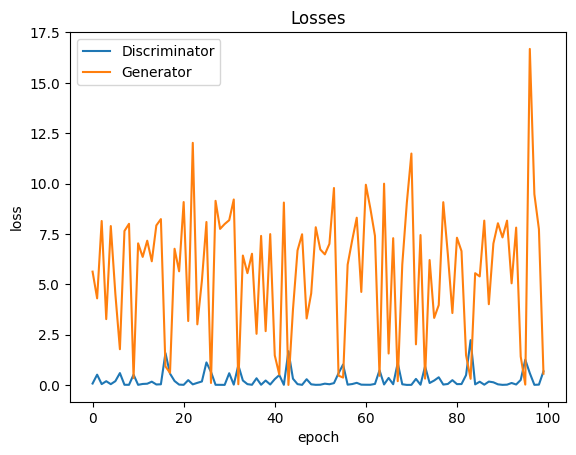

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');


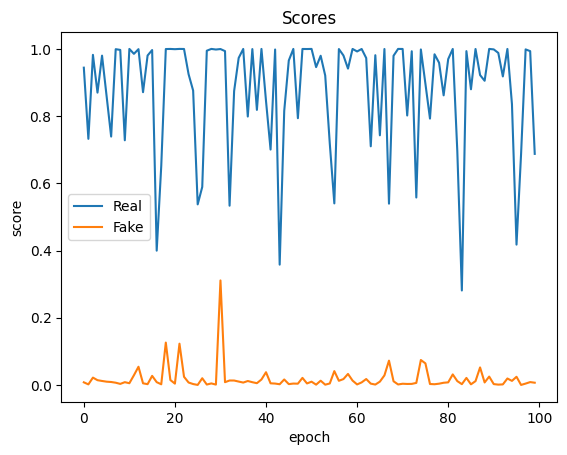

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

In [ ]:
#5

In [ ]:
generator.load_state_dict(torch.load('G2_updated3.pth'))
discriminator.load_state_dict(torch.load('D2_updated3.pth'))

C:\Users\yuvas\AppData\Local\Temp\ipykernel_7856\2924191508.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load('G2_updated3.pth'))
C:\U

<All keys matched successfully>

In [ ]:
generator = to_device(generator, device)
discriminator = to_device(discriminator, device)

In [ ]:
lr = 0.0002
opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

In [ ]:
epochs = 100
history = fit(epochs, lr, start_idx=401)
losses_g, losses_d, real_scores, fake_scores = history

  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 10.5062, loss_d: 0.1313, real_score: 0.8970, fake_score: 0.0015
Saving generated-2-images-0401.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 7.5385, loss_d: 0.0110, real_score: 0.9918, fake_score: 0.0026
Saving generated-2-images-0402.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 3.2253, loss_d: 0.8116, real_score: 0.6302, fake_score: 0.0022
Saving generated-2-images-0403.png


  0%|          | 0/141 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 8.4703, loss_d: 0.0952, real_score: 0.9198, fake_score: 0.0010
Saving generated-2-images-0404.png


  0%|          | 0/141 [00:00<?, ?it/s]

In [ ]:
torch.save(generator.state_dict(), 'G2_updated4.pth')
torch.save(discriminator.state_dict(), 'D2_updated4.pth')

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');